# 4. Graphing the HMI Wavefunctions
## A. Comparison With LCAO

### Setup code

We have obtained $\Phi(\phi)$, $S(\eta)$, and $R(\xi)$ from previous notebooks. It is now time to combine these functions to plot the entire MO.

As we have successfully obtained the equilibrium internuclear distance in the last notebook, from now on, we fix $D$ to be exactly 2.0.

Below is the code used to create $R(\xi)$ and $S(\eta)$. First, with the pre-calculated energy, $R(\xi)$ can be constructed. During this step, $c^2$ is also obtained. Then, $S(\eta)$ is constructed from the aforementioned $c^2$ and the pre-calculated polynomial expression of $\Lambda(c^2)$. 

In [1]:
import os
import numpy as np
from numpy import polynomial as P 
from scipy.integrate import solve_ivp
from scipy.optimize import fsolve
from scipy.interpolate import interp1d

import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('default')

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "figure.figsize": [8.0, 5.0]})

try:
    # this may look good for retina display users
    %config InlineBackend.figure_format = 'retina'
except:
    pass

# D = 2, always
D = 2

# Energy values from 3b_solve_R.ipynb
mo_nums = {
    '1 sigma g': (1, 0, 0),
    '1 sigma u *': (1, 0, 1),
    '1 pi u': (1, 1, 1),
    '2 sigma g': (2, 0, 0),
    '2 sigma u *': (2, 0, 1),
    '3 sigma g': (1, 0, 2),
    '1 pi g *': (1, 1, 2),
    '3 sigma u *':(1, 0, 3),
}

E_exact_dict = {
    '1 sigma g': -1.0996287880018977833884719075285829603672027587890625,
    '1 sigma u *': -0.66747226769876011331916743074543774127960205078125,
    '1 pi u': -0.428757630933387978711124333131010644137859344482421875,
    '2 sigma g': -0.360299650543231930743814928064239211380481719970703125,
    '2 sigma u *': -0.255397764046394915027349270530976355075836181640625,
    '3 sigma g': -0.2360276423296774617188731326677952893078327178955078125,
    '1 pi g *': -0.2266979721961866200974355933794868178665637969970703125,
    '3 sigma u *':-0.12664478743642726410456589292152784764766693115234375,
}

def get_lbda(mu, l):
    # retrieve Lambda from file
    filename = f"data_lbda/lbda_{mu}{l}.txt"
    filedir = os.path.join(os.path.abspath(''), filename)
    with open(filedir, 'r') as file:
        lbda_coef = np.loadtxt(file)
    lbda = P.Polynomial(lbda_coef) # a function of c2
    return lbda

def get_R(mu, l, E_exact):
    
    # greater values of l require greater cutoff values
    if l == 0:
        cutoff = 10
    elif l == 1:
        cutoff = 15
    elif l == 2:
        cutoff = 20
    elif l == 3:
        cutoff = 40
    
    c2 = (1/2) * E_exact * (D**2)
    lbda_val = get_lbda(mu, l)(c2)
    
    # initial value of g and g'
    q1 = np.array([1,-(2*D + c2 + mu*(mu+1) - lbda_val)/(2*(mu+1))])
    
    G = lambda xi, q: np.array([[0, 1],
    [-(2*D*xi + c2*(xi**2) + mu*(mu+1) - lbda_val)/(xi**2 - 1),
    -(2*(mu+1)*xi)/(xi**2 - 1)]]) @ q
    
    # solve for g(xi) for 1 < xi <= cutoff
    # exclude xi = 1 to avoid a divide-by-zero error
    xi_span_for_calc = np.linspace(1, cutoff, cutoff*100)
    eps = 1e-10
    xi_span_for_calc[0] = 1 + eps
    
    sol = solve_ivp(G, [1 + eps, cutoff], q1, t_eval=xi_span_for_calc)
    
    # calculate R from g
    R_vals = ((xi_span_for_calc ** 2 - 1)**(mu/2)) * sol.y[0]
    
    # add back xi = 0 and R(xi) = 0 or 1 depending on mu
    xi_span_for_calc[0] = 1
    R_vals[0] = 1 if mu == 0 else 0
    
    R_interp = interp1d(xi_span_for_calc, R_vals, kind='linear')
    
    # NOTE: xi greater than cutoff should result in R = 0
    # to be implemented with functions down the line
    return R_interp, cutoff

def get_S(mu, l, E_exact):
    
    # evenness determined by the number of angular nodes between the two nuclei
    # excluding angular nodes that contain the internuclear axis
    is_even = True if (l - mu) % 2 == 0 else False
    
    c2 = (1/2) * E_exact * (2.0**2)
    lbda_val = get_lbda(mu, l)(c2)

    p1 = np.array([1, ((mu*(mu+1) + c2 - lbda_val)/(2*(mu+1)))])

    F = lambda eta, p: np.array([[0, 1], 
    [(mu*(mu+1) - lbda_val + c2*(eta**2))/(1 - eta**2), 2*(mu+1)*eta/(1 - eta**2)]]) @ p
    
    # obtain values of f(eta) along these points (we exclude eta=1 to avoid a divide-by-zero error)
    eta_span = np.linspace(1, 0, 100)
    eps = 1e-10 # a very small value
    eta_span[0] = 1 - eps

    # solve using solve_ivp, sol.y[0] is f(eta_span) and sol.y[1] is f'(eta_span)
    sol = solve_ivp(F, [1 - eps, 0], p1, t_eval=eta_span)

    # we are plotting S(eta), not f(eta)
    S_vals = ((1 - eta_span**2) ** (mu/2)) * sol.y[0]

    # add back S_val(1) to eta_span
    S_vals[0] == 1 if mu == 0 else 0
    

    if is_even:
        S_vals = np.concatenate([S_vals[:-1], S_vals[::-1]])
    else:
        S_vals = np.concatenate([-S_vals[:-1], S_vals[::-1]])
    
    return interp1d(np.linspace(-1.0, 1.0, 199), S_vals, kind='linear')

### Bonding and antibonding MOs

For $1 \sigma_g$ and $1 \sigma_u^*$, the $\phi$-dependent part is a constant function. Therefore, $\psi(\xi, \eta, \phi) = A\,R(\xi)S(\eta)$ for some normalization constant $A$. As the volume element is $dV = \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta \, d\phi$ for $D = 2$, We can obtain the normalization constant through the following integrals (note that we are dealing with a real-valued wavefuntion).

$$1 = \int_{0}^{2\pi}\int_{-1}^{1}\int_{1}^{\infty} A^2 \left ( R(\xi) \right )^2 \left ( S(\eta) \right )^2 \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta \, d\phi$$

$$= 2\pi A^2  \int_{-1}^{1}\int_{1}^{\infty} \left ( R(\xi) \right )^2 \left ( S(\eta) \right )^2 \left (\xi^2 - \eta^2 \right ) d\xi \, d\eta$$

Therefore, 
$$\frac{1}{2\pi A^2}=  \left \{ \int_{-1}^{1} \left ( S(\eta) \right )^2 d\eta \int_{1}^{\infty} \xi^2 \left ( R(\xi) \right )^2  d\xi - \int_{-1}^{1} \eta^2 \left ( S(\eta) \right )^2 d\eta \int_{1}^{\infty} \left ( R(\xi) \right )^2  d\xi \right \}$$

These integrals are calculated numerically with `scipy.integrated.simpson`.

Using the integral above, a contour plot of the wavefunction along the xz-plane can be drawn.

In [2]:
"""
 Exact MO |  LCAO-MO
 sigma_u     sigma_u_1s 
 sigma_g     sigma_g_1s

All takes cartesian coordinates
"""

from scipy.integrate import simpson

# exact mo of mo along the xz-plane
def get_mo_slice(l, E_exact):
    R, cutoff = get_R(0, l, E_exact)
    S = get_S(0, l, E_exact)

    # above needs to be normalized
    # volume element = (xi**2 - eta**2) * d xi * d eta * d phi
    # integration with phi yields norm constant of 2*pi
    
    eta_span = np.linspace(-1.0, 1.0, 101)
    S2_int = simpson(S(eta_span)**2, x=eta_span)
    eta2_S2_int = simpson((eta_span*S(eta_span))**2, x=eta_span)

    xi_span = np.linspace(1.0, cutoff, cutoff*50)
    R2_int = simpson(R(xi_span)**2, x=xi_span)
    xi2_R2_int = simpson((xi_span*R(xi_span))**2, x=xi_span)

    # norm_const = A in the equation above
    norm_const = np.sqrt(2*np.pi*(S2_int*xi2_R2_int - eta2_S2_int*R2_int))

    def mo_returned(x, z):
        rA = np.sqrt(x**2 + (z + 1.0)**2)
        rB = np.sqrt(x**2 + (z - 1.0)**2)
        
        xi = (rA + rB)/2.0
        eta = (rA - rB)/2.0
        
        # check for bounds
        if xi < 1.0:
            xi = 1.0
        
        if eta < -1.0:
            eta = -1.0
        elif eta > 1.0:
            eta = 1.0
        
        # because we work with sigma orbitals only
        # we do not deal with phi

        # xi greater than the cutoff value -> R = 0
        # implemented here
        if xi > cutoff:
            return 0
        else:
            return (R(xi)*S(eta))/norm_const

    return mo_returned

# exact mo of mo along the xz-plane
# l == 0: bonding, l == 1: antibonding
def get_lcao_slice(l):
    # 1s orbital, function of r only
    s_orbital = lambda r: np.exp(-r)/np.sqrt(np.pi)

    def lcao_returned(x, z, l):
        rA = np.sqrt(x**2 + (z + 1.0)**2)
        rB = np.sqrt(x**2 + (z - 1.0)**2)

        # normalization constants from literature
        S_2 = np.exp(-2.0) * (1 + 2.0 + (2.0**2)/3)
        
        
        if l == 0: # bonding
            return (s_orbital(rB) + s_orbital(rA))/np.sqrt(2 * (1 + S_2))
        else: # antibonding
            return (s_orbital(rB) - s_orbital(rA))/np.sqrt(2 * (1 - S_2))

    return lambda x, z: lcao_returned(x, z, l)

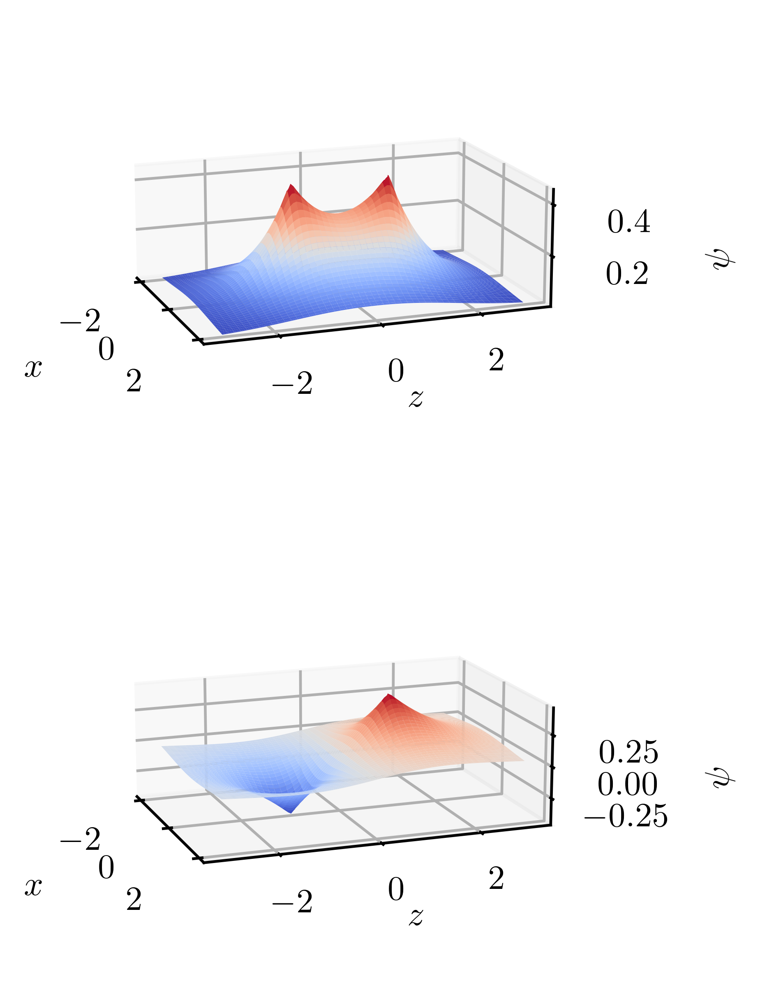

In [3]:
# plotting 3D contour plots

from matplotlib import cm

# given an l, return notation for E_exact_dict
mo_notations = ['1 sigma g', '1 sigma u *']

fig, axes = plt.subplots(2, 1, subplot_kw={"projection":'3d'})

mo_slices = []

for l, mo_notation in enumerate(mo_notations):
    mo_slice = np.vectorize(get_mo_slice(l, E_exact_dict[mo_notation]))
    mo_slices.append(mo_slice)
    
    X = np.linspace(-2.0, 2.0, 100)
    Z = np.linspace(-3.0, 3.0, 100)
    X, Z = np.meshgrid(X, Z)
    PSI = mo_slice(X, Z)
    im = axes[l].plot_surface(X, Z, PSI, cmap=cm.coolwarm)
    axes[l].set_xlabel('$x$')
    axes[l].set_ylabel('$z$')
    axes[l].set_zlabel('$\psi$')
    axes[l].set_box_aspect((2, 3, 1))
    axes[l].view_init(elev=15, azim=-20)

Values of the exact MO and its LCAO counterpart, calculated along the internuclear axis, is plotted below for comparison.

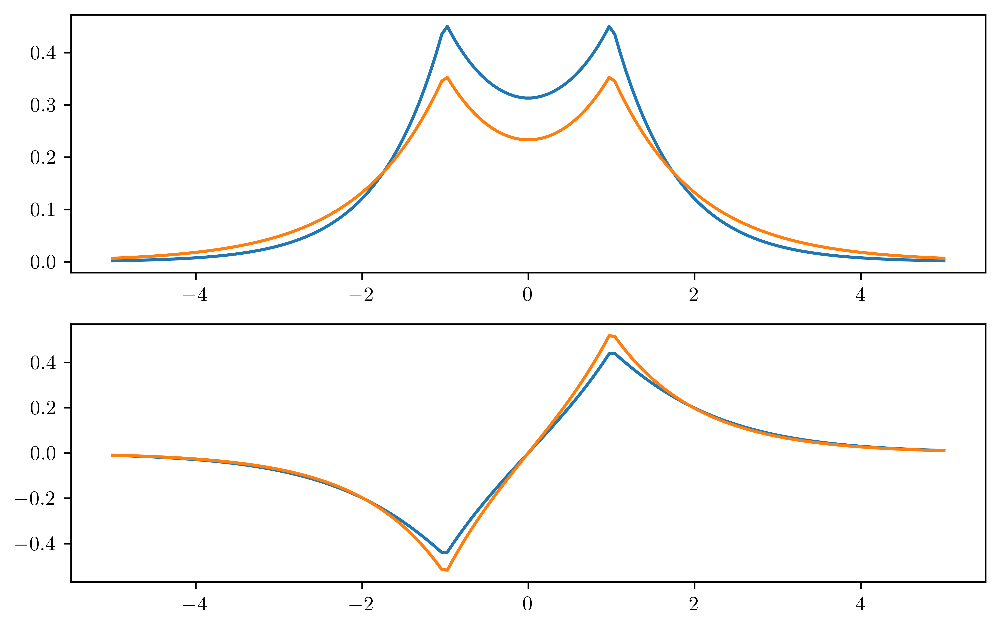

In [4]:
# cutaway

z_span = np.linspace(-5, 5, 150)

fig, axes = plt.subplots(2, 1)

for l in range(2):
    mo_z = np.vectorize(lambda z: mo_slices[l](0, z))
    axes[l].plot(z_span, mo_z(z_span))
    lcao_slice = get_lcao_slice(l)
    lcao_z = np.vectorize(lambda z: lcao_slice(0, z))
    axes[l].plot(z_span, lcao_z(z_span))
    



For the bonding MOs, the exact MO has a larger amplitude than the LCAO MO at the middle, which results in a higher electron density between the to nuclei. This is to be expected as the exact MO takes account for the attraction of the electron from the two nuclei simultaneously, while LCAO MO somewhat averages the two attraction. 

As a result, the exact MO has a lower $E_{tot}$ than the LCAO MO (due to the increased electron density), and the exact MO has a smaller $D_e$ (as the electron shields the repulsion between the two nuclei better). A similar analysis can be made for the antibonding MOs.

### The Shapes of Orbitals

Here, we finally investigate the MOs themselves, in glorious 3D. There are two ways of representing orbitals implemented below.

The first is a 3D scatterplot, where the density of dots is directly proportional to the electron (probability) density $\left | \psi \right |^2$. The color of the dot represents the sign(phase to be more technical) of the wavefunction $\psi$ at that point - red is positive, blue is negative.

Second is a 3D plot of the contour surface of $\left | \psi \right |^2$. More specifically, it is the isosurface of $\left | \psi \right |^2$ that encompasses a volume in which the electron will be found 90% of the time. The color coding is the came with the 3D scatter plot.

Both 3D plots are implemented in the same way by the following procedure. A python script generates data (collection of points or a mesh surface), which is then saved to disk. Another python script is used to generate the graph shown in this notebook.

### Scatterplot



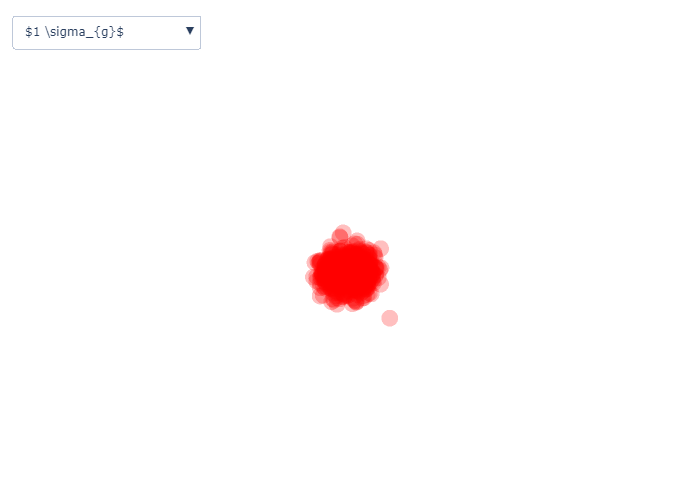

In [8]:
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'jupyterlab'
# pio.renderers.default = 'browser'

mo_notations = [
    '1 sigma g',
    '1 sigma u *',
    '1 pi u',
    '2 sigma g',
    '2 sigma u *',
    '3 sigma g',
    '1 pi g *',
    '3 sigma u *',
]

mo_latex = {
    '1 sigma g': r"$1 \sigma_{g}$",
    '1 sigma u *': r"$1 \sigma_{u}^{\ast}$",
    '1 pi u': r"$1 \pi_{u}$",
    '2 sigma g' : r"$2 \sigma_{g}$",
    '3 sigma g' : r"$3 \sigma_{g}$",
    '2 sigma u *' : r"$2 \sigma_{u}^{*}$",
    '1 pi g *' : r"$1 \pi_{g}^{*}$",
    '3 sigma u *' : r"$3 \sigma_{u}^{*}$",
}

mo_range = {
    '1 sigma g': 2,
    '1 sigma u *': 3,
    '1 pi u': 6,
    '2 sigma g': 7,
    '2 sigma u *': 8,
    '3 sigma g': 9,
    '1 pi g *': 9,
    '3 sigma u *': 15,
}

opacity = 0.25
sample_size = 2000

# y, z, x
fig = go.Figure()



fig.update_layout(
    template='plotly_white',
    margin=dict(l=5, r=5, t=5, b=5),
    height = 500,
    showlegend=False,
    scene = dict(
        xaxis_visible=False,
        yaxis_visible=False,
        zaxis_visible=False,
    )
)

buttons = []

for ind, mo_notation in enumerate(mo_notations):
    n, mu, l = mo_nums[mo_notation]
    
    # retrieve Lambda from file
    filename = f"data_scatter/samples_{n}{mu}{l}.npy"
    filedir = os.path.join(os.path.abspath(''), filename)
    samples_loaded = np.load(filedir)

    points = samples_loaded[:sample_size, :3]
    points_sign = samples_loaded[:sample_size, 3].astype(bool)

    pos_points = points[points_sign, :]
    neg_points = points[np.logical_not(points_sign), :]
    
    init_visible = True if ind == 0 else False
    
    fig.add_trace(
        go.Scatter3d(
            visible=init_visible,
            x=pos_points[:, 1], 
            y=pos_points[:, 2], 
            z=pos_points[:, 0],
            mode='markers',
            marker=dict(
                size=5,
                color='red',                
                opacity=opacity
            )
        )
    )
    fig.add_trace(
        go.Scatter3d(
            visible=init_visible,
            x=neg_points[:, 1], 
            y=neg_points[:, 2], 
            z=neg_points[:, 0],
            mode='markers',
            marker=dict(
                size=5,
                color='blue',                
                opacity=opacity
            )
        )
    )
    
    button = dict(
        label=mo_latex[mo_notation],
        method='update',
        args=[{'visible': [False] * 17}])
    
    button['args'][0]['visible'][-1] = True
    button['args'][0]['visible'][2*ind] = True
    button['args'][0]['visible'][2*ind+1] = True
    buttons.append(button)

fig.add_trace(
    go.Scatter3d(
        x=[0, 0],
        y=[-1, 1],
        z=[0, 0],
        mode='markers',
        marker=dict(
            size=2,
            color='black',
            opacity=1.0
        )
    )
)
    
fig.update_traces(
    hoverinfo='skip',
    showlegend=False
)
    
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=buttons,
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.1,
            yanchor="top"
        )
    ]
)



fig.update_layout(
    scene = dict(
        xaxis = dict(range=[-24, 24]),
        yaxis = dict(range=[-40, 40]),
        zaxis = dict(range=[-24, 24]),
        aspectratio=dict(x=24, 
                         y=40, 
                         z=24,),
        camera=dict(eye=dict(x=25, y=3.0, z=3.0))))


"""

_range = mo_range[mo_notation] * 1.7
ranges = [[-_range*0.7, _range*0.7], 
          [-_range*0.7, _range*0.7], 
          [-_range, _range]]



fig.update_layout(
    scene = dict(
        xaxis = dict(range=ranges[1]),
        yaxis = dict(range=ranges[2]),
        zaxis = dict(range=ranges[0]),
        aspectratio=dict(x=(ranges[1][1] - ranges[1][0]), 
                         y=(ranges[2][1] - ranges[2][0]), 
                         z=(ranges[0][1] - ranges[0][0]),),
        camera=dict(eye=dict(x=_range*3.5, y=3.0, z=3.0))))

"""
fig.show()


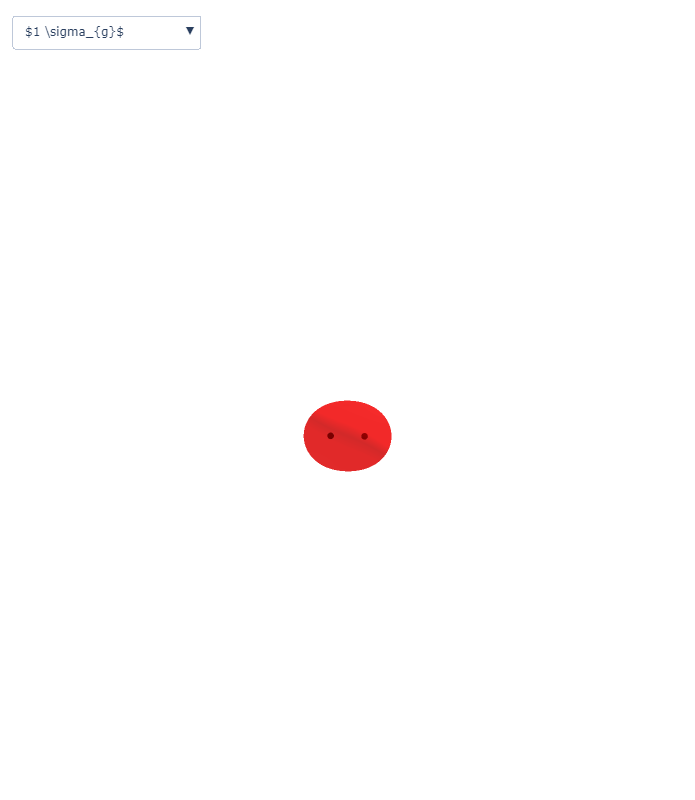

In [6]:
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'jupyterlab'
# pio.renderers.default = 'browser'

mo_notations = [
    '1 sigma g',
    '1 sigma u *',
    '1 pi u',
    '2 sigma g',
    '2 sigma u *',
    '3 sigma g',
    '1 pi g *',
    '3 sigma u *',
]

mo_latex = {
    '1 sigma g': r"$1 \sigma_{g}$",
    '1 sigma u *': r"$1 \sigma_{u}^{\ast}$",
    '1 pi u': r"$1 \pi_{u}$",
    '2 sigma g' : r"$2 \sigma_{g}$",
    '3 sigma g' : r"$3 \sigma_{g}$",
    '2 sigma u *' : r"$2 \sigma_{u}^{*}$",
    '1 pi g *' : r"$1 \pi_{g}^{*}$",
    '3 sigma u *' : r"$3 \sigma_{u}^{*}$",
}

opacity = 0.6

# y, z, x
fig = go.Figure()

fig.update_layout(
    template='plotly_white',
    margin=dict(l=5, r=5, t=5, b=5),
    height = 800,
    showlegend=False,
    scene = dict(
        xaxis_visible=False,
        yaxis_visible=False,
        zaxis_visible=False,
    )
)

fig.add_trace(
    go.Scatter3d(
        x=[0, 0],
        y=[-1, 1],
        z=[0, 0],
        mode='markers',
        marker=dict(
            size=2,
            color='black',
            opacity=1.0
        )
    )
)


buttons = []

for ind, mo_notation in enumerate(mo_notations):
    n, mu, l = mo_nums[mo_notation]
    
    # retrieve Lambda from file
    filename = f"data_isosurface/isosurface_{n}{mu}{l}_verts_pos.npy"
    filedir = os.path.join(os.path.abspath(''), filename)
    verts_pos = np.load(filedir)
    
    # retrieve Lambda from file
    filename = f"data_isosurface/isosurface_{n}{mu}{l}_faces_pos.npy"
    filedir = os.path.join(os.path.abspath(''), filename)
    faces_pos = np.load(filedir)
    
    init_visible = True if ind == 0 else False
    
    fig.add_trace(
        go.Mesh3d(
            # 8 vertices of a cube
            x=verts_pos[:, 1],
            y=verts_pos[:, 2],
            z=verts_pos[:, 0],
            
            # i, j and k give the vertices of triangles
            i = faces_pos[:, 1],
            j = faces_pos[:, 2],
            k = faces_pos[:, 0],
            color='red',
            opacity=opacity,
            visible=init_visible
        )
    )
    
    if n + mu + l > 1:
        # retrieve Lambda from file
        filename = f"data_isosurface/isosurface_{n}{mu}{l}_verts_neg.npy"
        filedir = os.path.join(os.path.abspath(''), filename)
        verts_neg = np.load(filedir)
        
            
        # retrieve Lambda from file
        filename = f"data_isosurface/isosurface_{n}{mu}{l}_faces_neg.npy"
        filedir = os.path.join(os.path.abspath(''), filename)
        faces_neg = np.load(filedir)
        
        fig.add_trace(
            go.Mesh3d(
                # 8 vertices of a cube
                x=verts_neg[:, 1],
                y=verts_neg[:, 2],
                z=verts_neg[:, 0],

                # i, j and k give the vertices of triangles
                i = faces_neg[:, 1],
                j = faces_neg[:, 2],
                k = faces_neg[:, 0],
                color='blue',
                opacity=opacity,
                visible=init_visible
            )
        )
    
    
    
    
    button = dict(
        label=mo_latex[mo_notation],
        method='update',
        args=[{'visible': [False] * 16}])
    
    button['args'][0]['visible'][0] = True
    
    button['args'][0]['visible'][2*ind] = True
    button['args'][0]['visible'][2*ind+1] = True
    buttons.append(button)


    
fig.update_traces(
    hoverinfo='skip',
    showlegend=False
)
    
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=buttons,
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.01,
            xanchor="left",
            y=1.1,
            yanchor="top"
        )
    ]
)



fig.update_layout(
    scene = dict(
        xaxis = dict(range=[-24, 24]),
        yaxis = dict(range=[-40, 40]),
        zaxis = dict(range=[-24, 24]),
        aspectratio=dict(x=24, 
                         y=40, 
                         z=24,),
        camera=dict(eye=dict(x=25, y=3.0, z=3.0))))


"""

_range = mo_range[mo_notation] * 1.7
ranges = [[-_range*0.7, _range*0.7], 
          [-_range*0.7, _range*0.7], 
          [-_range, _range]]



fig.update_layout(
    scene = dict(
        xaxis = dict(range=ranges[1]),
        yaxis = dict(range=ranges[2]),
        zaxis = dict(range=ranges[0]),
        aspectratio=dict(x=(ranges[1][1] - ranges[1][0]), 
                         y=(ranges[2][1] - ranges[2][0]), 
                         z=(ranges[0][1] - ranges[0][0]),),
        camera=dict(eye=dict(x=_range*3.5, y=3.0, z=3.0))))

"""
fig.show()
